In [141]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots
import plotly.graph_objs as go
from plotly.subplots import make_subplots

In [7]:
#####importing dataset
data = pd.read_csv("gem_prices.csv")
data

,Unnamed: 0,carat,cut,color,clarity,depth,table,x,y,z,price
0,1,0.30,Ideal,E,SI1,62.1,58.0,4.27,4.29,2.66,499
1,2,0.33,Premium,G,IF,60.8,58.0,4.42,4.46,2.70,984
2,3,0.90,Very Good,E,VVS2,62.2,60.0,6.04,6.12,3.78,6289
3,4,0.42,Ideal,F,VS1,61.6,56.0,4.82,4.80,2.96,1082
4,5,0.31,Ideal,F,VVS1,60.4,59.0,4.35,4.43,2.65,779
...,...,...,...,...,...,...,...,...,...,...,...
26962,26963,1.11,Premium,G,SI1,62.3,58.0,6.61,6.52,4.09,5408
26963,26964,0.33,Ideal,H,IF,61.9,55.0,4.44,4.42,2.74,1114
26964,26965,0.51,Premium,E,VS2,61.7,58.0,5.12,5.15,3.17,1656
26965,26966,0.27,Very Good,F,VVS2,61.8,56.0,4.19,4.20,2.60,682


# Steps in Data Exploration and Preprocessing:
   Identification of variables and data types
   
   Analyzing the basic metrics
   
   Non-Graphical Univariate Analysis
   
   Graphical Univariate Analysis
   
   Bivariate Analysis
   
   Missing value treatment
   
   Outlier treatment
   
   Correlation Analysis
   
   Dimensionality Reduction

In [8]:
data.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,x,y,z,price
0,1,0.30,Ideal,E,SI1,62.1,58.0,4.27,4.29,2.66,499
1,2,0.33,Premium,G,IF,60.8,58.0,4.42,4.46,2.70,984
2,3,0.90,Very Good,E,VVS2,62.2,60.0,6.04,6.12,3.78,6289
3,4,0.42,Ideal,F,VS1,61.6,56.0,4.82,4.80,2.96,1082
4,5,0.31,Ideal,F,VVS1,60.4,59.0,4.35,4.43,2.65,779


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26967 entries, 0 to 26966
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  26967 non-null  int64  
 1   carat       26967 non-null  float64
 2   cut         26967 non-null  object 
 3   color       26967 non-null  object 
 4   clarity     26967 non-null  object 
 5   depth       26270 non-null  float64
 6   table       26967 non-null  float64
 7   x           26967 non-null  float64
 8   y           26967 non-null  float64
 9   z           26967 non-null  float64
 10  price       26967 non-null  int64  
dtypes: float64(6), int64(2), object(3)
memory usage: 2.3+ MB


In [10]:
data.columns.values

array(['Unnamed: 0', 'carat', 'cut', 'color', 'clarity', 'depth', 'table',
       'x', 'y', 'z', 'price'], dtype=object)

In [14]:
data.shape
#######there are 26967 rows and 11 columns in the dataset

(26967, 11)

# UNIVARIATE ANALYSIS

In [15]:
data.describe()

,Unnamed: 0,carat,depth,table,x,y,z,price
count,26967.000000,26967.000000,26270.000000,26967.000000,26967.000000,26967.000000,26967.000000,26967.000000
mean,13484.000000,0.798375,61.745147,57.456080,5.729854,5.733569,3.538057,3939.518115
std,7784.846691,0.477745,1.412860,2.232068,1.128516,1.166058,0.720624,4024.864666
min,1.000000,0.200000,50.800000,49.000000,0.000000,0.000000,0.000000,326.000000
25%,6742.500000,0.400000,61.000000,56.000000,4.710000,4.710000,2.900000,945.000000
50%,13484.000000,0.700000,61.800000,57.000000,5.690000,5.710000,3.520000,2375.000000
75%,20225.500000,1.050000,62.500000,59.000000,6.550000,6.540000,4.040000,5360.000000
max,26967.000000,4.500000,73.600000,79.000000,10.230000,58.900000,31.800000,18818.000000


In [16]:
pip install optuna

Note: you may need to restart the kernel to use updated packages.


In [17]:
import optuna

In [12]:
#### let's see the unique value counts in the dataset cut column
data['cut'].value_counts()
#####there are 5 different specilized shapes are there in cut column

Ideal        10816
Premium       6899
Very Good     6030
Good          2441
Fair           781
Name: cut, dtype: int64

In [45]:
fig = px.bar(data.groupby('cut', as_index=False).size().sort_values(by='size', ascending=False), x='cut', y='size',
        color = ['gold', 'lightgreen', 'red', 'lightblue', 'pink'], template='plotly_dark', title='<b> Distribution of Cut of Gems')
fig.update_layout(title_x=0.5)

In [33]:
#### let's see the unique value counts in the dataset coor column
data['color'].value_counts()
#####there are 7 different specilized shapes are there in cut column+

G    5661
E    4917
F    4729
H    4102
D    3344
I    2771
J    1443
Name: color, dtype: int64

In [49]:
fig = px.bar(data.groupby('color', as_index=False).size().sort_values(by='size', ascending=False), x='color', y='size',
        color_discrete_sequence=['orange'] , template='plotly_dark', title='<b> Number of different color values')
fig.update_layout(title_x=0.5)

In [34]:
#### let's see the unique value counts in the dataset cut column
data['clarity'].value_counts()
#####there are 8 different specilized shapes are there in cut column

SI1     6571
VS2     6099
SI2     4575
VS1     4093
VVS2    2531
VVS1    1839
IF       894
I1       365
Name: clarity, dtype: int64

In [52]:
fig = px.bar(data.groupby('clarity', as_index=False).size().sort_values(by='size', ascending=False), x='clarity', y='size',
        color=['gold', 'lightgreen', 'red', 'lightblue', 'green', 'pink', 'blue', 'orange'], template='plotly_dark', title='<b> Number of different clarity values')
fig.update_layout(title_x=0.5)

In [58]:
import warnings
warnings.filterwarnings('ignore')  # ignore notifications
import sys
import os


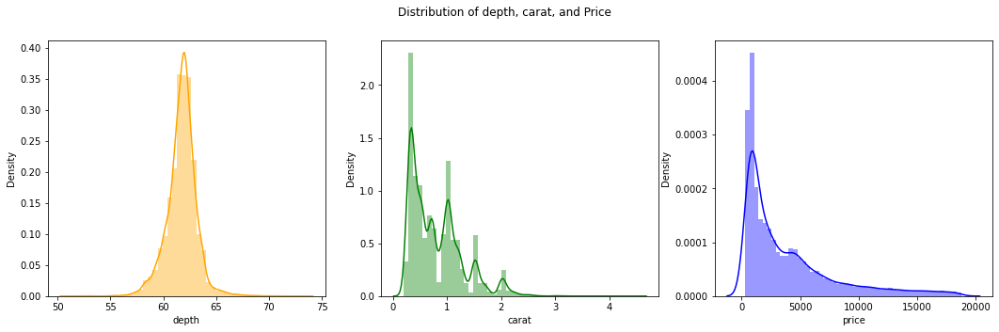

In [63]:
plt.rcParams['figure.figsize']=18,5
plt.subplot(131)
sns.distplot(data['depth'], color='orange')

plt.subplot(132)
sns.distplot(data['carat'], color='green')

plt.subplot(133)
sns.distplot(data['price'], color='blue')

plt.suptitle('Distribution of depth, carat, and Price')
plt.show()


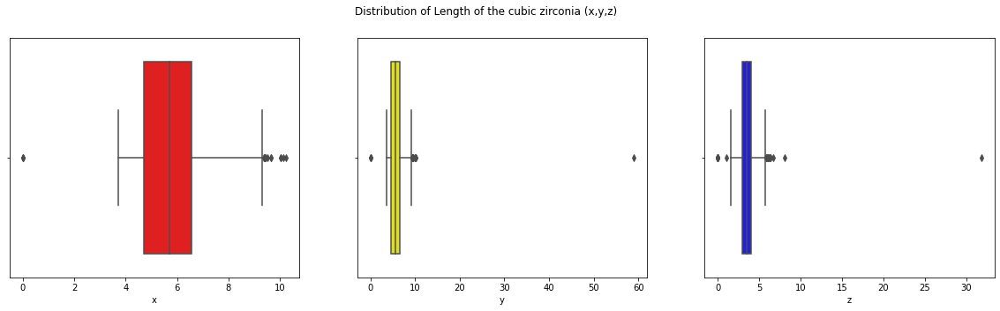

In [67]:
plt.rcParams['figure.figsize']=20,5
plt.subplot(131)
sns.boxplot(data['x'], color='red')

plt.subplot(132)
sns.boxplot(data['y'], color='yellow')

plt.subplot(133)
sns.boxplot(data['z'], color='blue')

plt.suptitle('Distribution of Length of the cubic zirconia (x,y,z)')
plt.show()

# BIVARIATE ANALYSIS

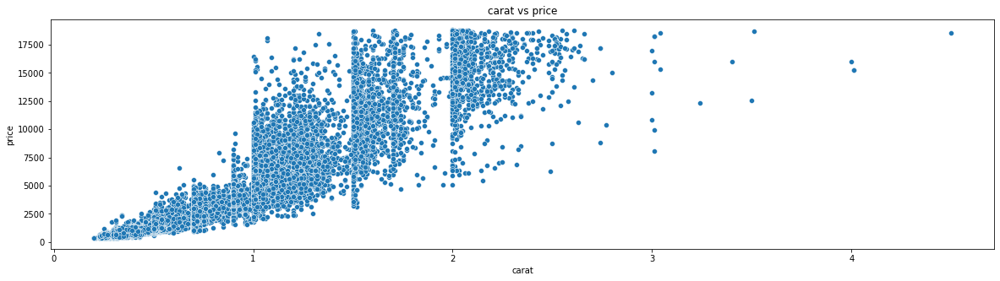

In [71]:
sns.scatterplot(data['carat'], data['price'])
plt.title('carat vs price')
plt.show()

as carat is increasing the price is also increasing

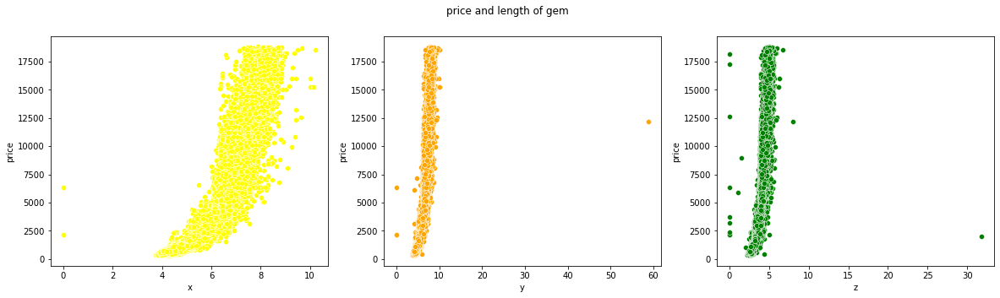

In [73]:
plt.rcParams['figure.figsize']=20,5
plt.subplot(131)
sns.scatterplot(data['x'], data['price'], color='yellow')

plt.subplot(132)
sns.scatterplot(data['y'], data['price'], color='orange')

plt.subplot(133)
sns.scatterplot(data['z'], data['price'], color='green')

plt.suptitle('price and length of gem')
plt.show()

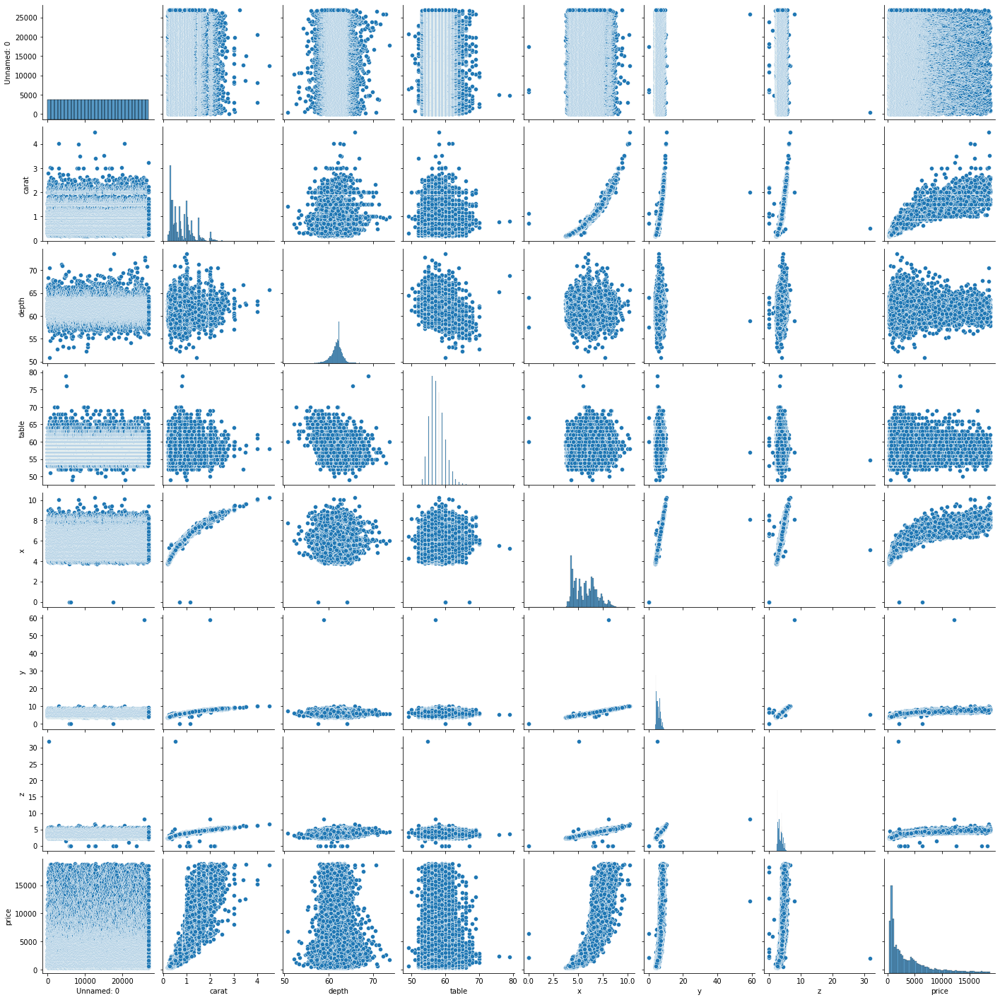

In [82]:
sns.pairplot(data)

In [86]:
scl = [ [0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
    [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[1,"rgb(220, 220, 220)"] ]
fig = px.box(data, x="cut", y="price", template='plotly_dark', title='<b> cut vs price', color='cut')
fig.update_layout(title_x=0.5)
fig.show()

In [85]:
scl = [ [0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
    [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[1,"rgb(220, 220, 220)"] ]
fig = px.box(data, x="clarity", y="price", template='plotly_dark', title='<b>clarity vs price', color='clarity')
fig.update_layout(title_x=0.5)
fig.show()

In [87]:
scl = [ [0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
    [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[1,"rgb(220, 220, 220)"] ]
fig = px.box(data, x="color", y="price", template='plotly_dark', title='<b> color vs price', color='color')
fig.update_layout(title_x=0.5)
fig.show()

# check for null values

In [88]:
data.isnull().sum()

Unnamed: 0      0
carat           0
cut             0
color           0
clarity         0
depth         697
table           0
x               0
y               0
z               0
price           0
dtype: int64

in the depth column we seen that there are 697 null values are there

In [97]:
data['depth']

0        62.1
1        60.8
2        62.2
3        61.6
4        60.4
         ... 
26962    62.3
26963    61.9
26964    61.7
26965    61.8
26966    62.0
Name: depth, Length: 26967, dtype: float64

In [95]:
(data['depth'].median(),data['depth'].mean(),data['depth'].mode())

(61.8,
 61.745146555006194,
 0    62.0
 dtype: float64)

in the depth column that seems to be more values are in the 60 and above it most of the values are nearly ranges between 60 and 63 so we are replacing null values with median

In [98]:
######replace null values with median
data['depth'].fillna(data['depth'].median(), inplace= True)

In [99]:
####now again check for null values
data.isnull().sum()

Unnamed: 0    0
carat         0
cut           0
color         0
clarity       0
depth         0
table         0
x             0
y             0
z             0
price         0
dtype: int64

we have successfully filled the null values

# check for outliers

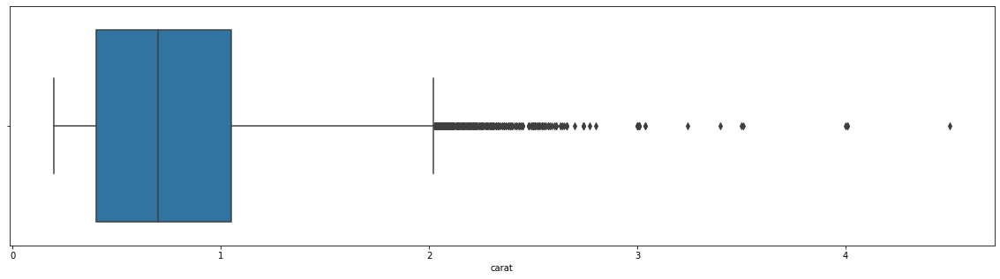

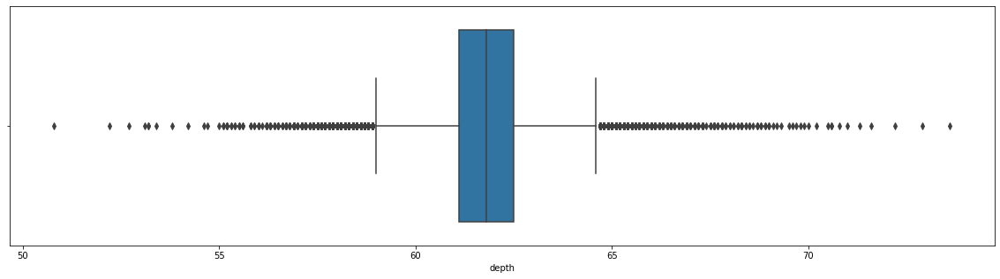

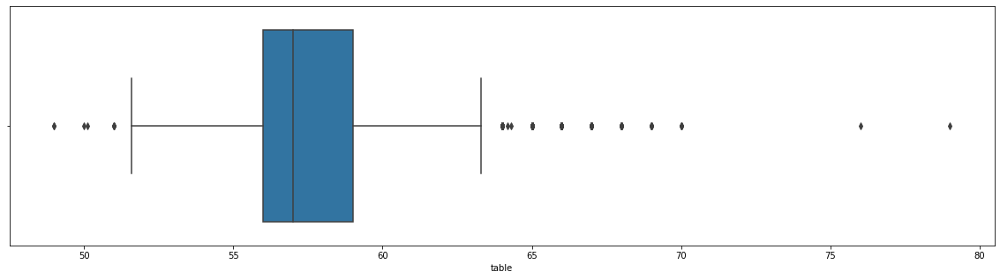

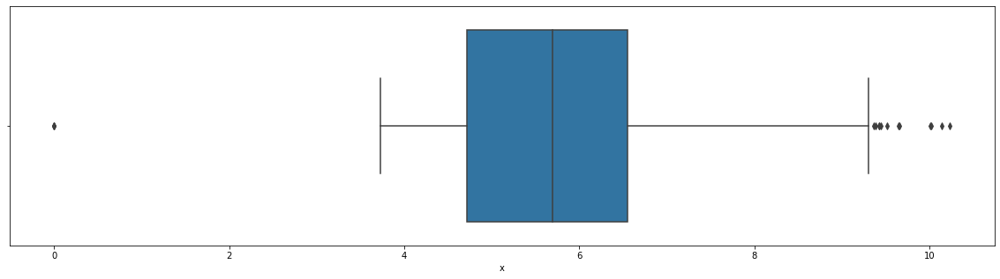

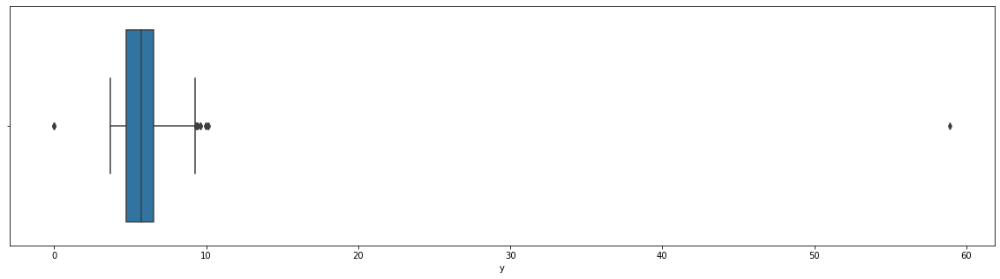

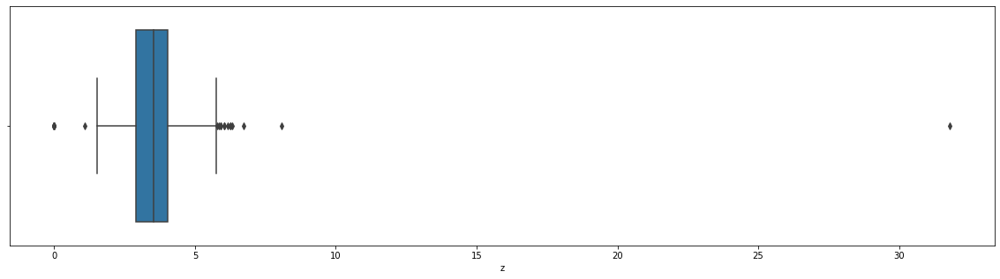

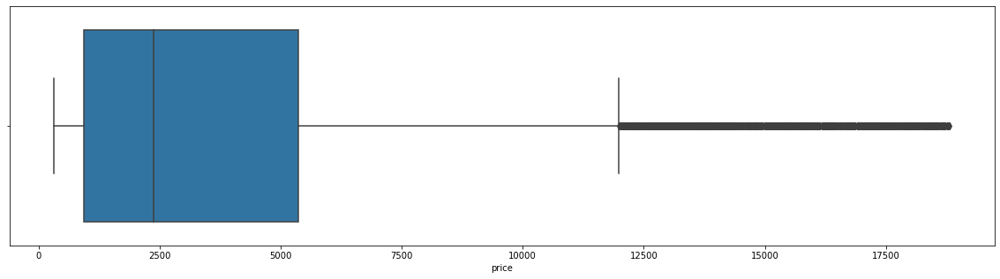

In [103]:
columns = ['carat','depth', 'table', 'x', 'y', 'z',
       'price' ]
for i in columns:
    sns.boxplot(data[i],whis=1.5)
    plt.show();
   

now we removed the outliers in the dataset now again we chech for outliers for confirmation in the data

In [111]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range
for column in data[cols].columns:
    lr,ur=remove_outlier(data[column])
    data[column]=np.where(data[column]>ur,ur,data[column])
    data[column]=np.where(data[column]<lr,lr,data[column])

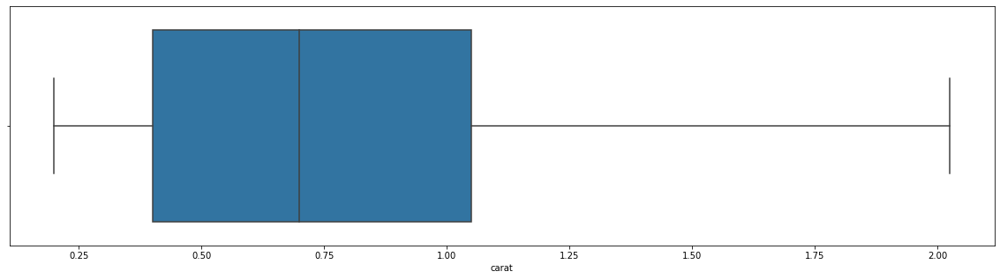

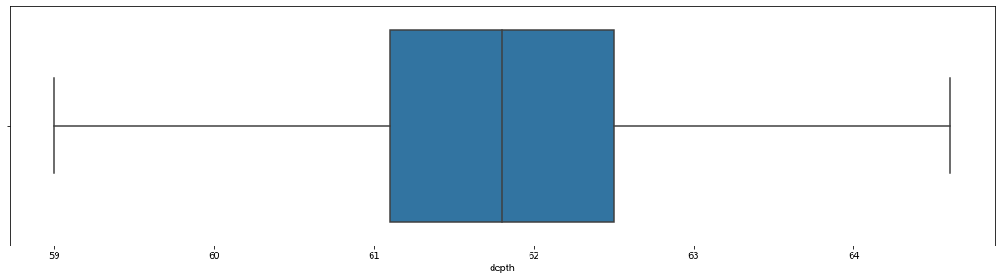

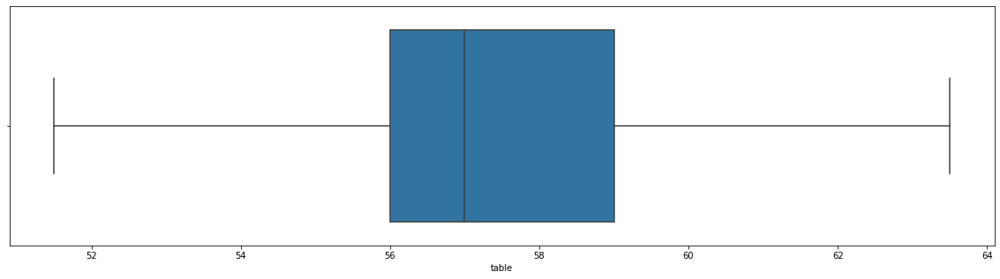

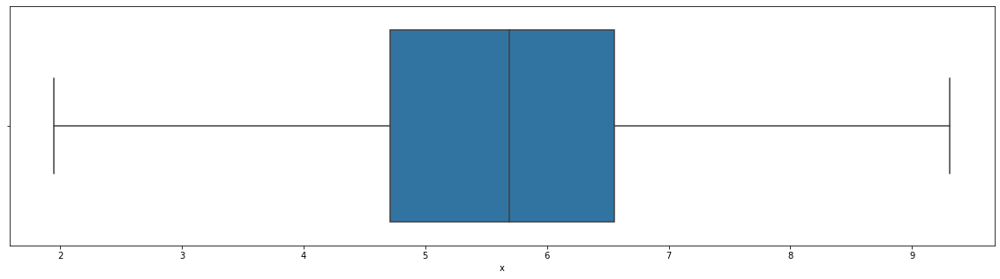

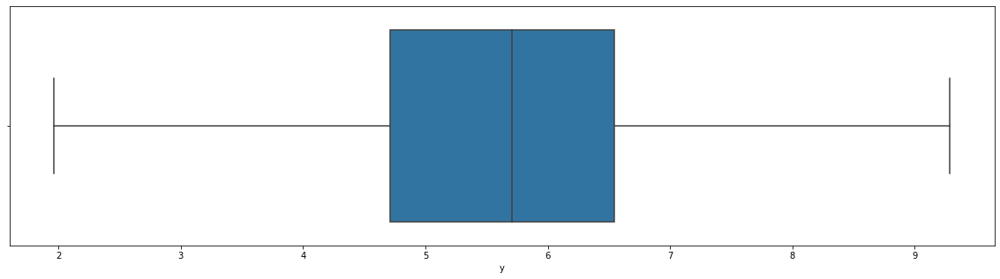

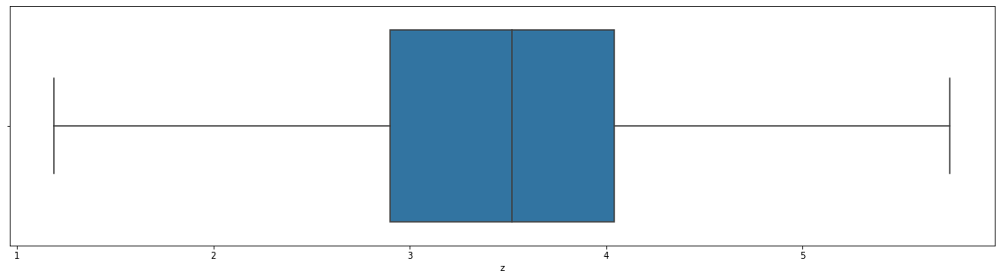

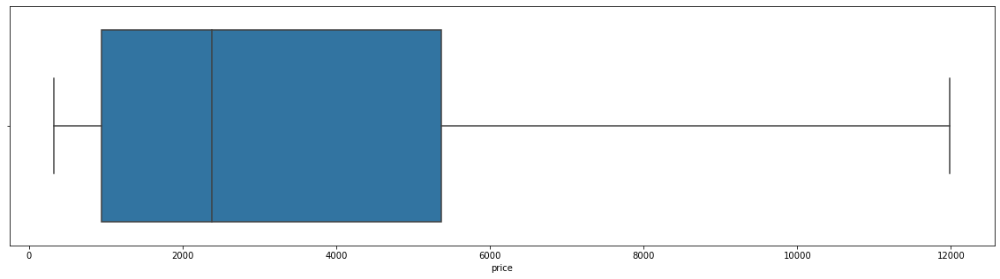

In [112]:
columns = ['carat','depth', 'table', 'x', 'y', 'z',
       'price' ]
for i in columns:
    sns.boxplot(data[i],whis=1.5)
    plt.show();
   

Converting objects to categorical variables

In [126]:
data['cut']=data['cut'].replace(('Fair', 'Good', 'Very Good', 'Premium', 'Ideal'), (1,2,3,4,5))
data['clarity']=data['clarity'].replace(('SI1', 'IF', 'VVS2', 'VS1', 'VVS1', 'VS2', 'SI2', 'I1'), (1,2,3,4,5,6,7,8))
data['color']=data['color'].replace(('E', 'G', 'F', 'D', 'H', 'J', 'I'), (1,2,3,4,5,6,7))

In [127]:
data.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,x,y,z,price
0,1,0.30,5,1,1,62.1,58.0,4.27,4.29,2.66,499.0
1,2,0.33,4,2,2,60.8,58.0,4.42,4.46,2.70,984.0
2,3,0.90,3,1,3,62.2,60.0,6.04,6.12,3.78,6289.0
3,4,0.42,5,3,4,61.6,56.0,4.82,4.80,2.96,1082.0
4,5,0.31,5,3,5,60.4,59.0,4.35,4.43,2.65,779.0


# Finding the correlation

In [128]:
data.corr()

,Unnamed: 0,carat,cut,color,clarity,depth,table,x,y,z,price
Unnamed: 0,1.000000,0.003714,-0.004014,0.003535,0.009486,-0.004931,0.004986,0.004558,0.004456,0.003884,0.000917
carat,0.003714,1.000000,-0.142426,0.250556,0.124754,0.029528,0.187395,0.982207,0.981285,0.977328,0.936741
cut,-0.004014,-0.142426,1.000000,-0.032440,-0.018966,-0.225346,-0.436416,-0.132613,-0.132507,-0.157356,-0.068770
color,0.003535,0.250556,-0.032440,1.000000,-0.005187,0.050349,0.025275,0.233951,0.233677,0.236868,0.144033
clarity,0.009486,0.124754,-0.018966,-0.005187,1.000000,-0.011052,0.039946,0.121180,0.118418,0.118538,0.064958
depth,-0.004931,0.029528,-0.225346,0.050349,-0.011052,1.000000,-0.289564,-0.019937,-0.022966,0.095160,-0.000789
table,0.004986,0.187395,-0.436416,0.025275,0.039946,-0.289564,1.000000,0.199146,0.193530,0.159425,0.137971
x,0.004558,0.982207,-0.132613,0.233951,0.121180,-0.019937,0.199146,1.000000,0.998495,0.988179,0.912759
y,0.004456,0.981285,-0.132507,0.233677,0.118418,-0.022966,0.193530,0.998495,1.000000,0.987853,0.914191
z,0.003884,0.977328,-0.157356,0.236868,0.118538,0.095160,0.159425,0.988179,0.987853,1.000000,0.905737


<AxesSubplot:>

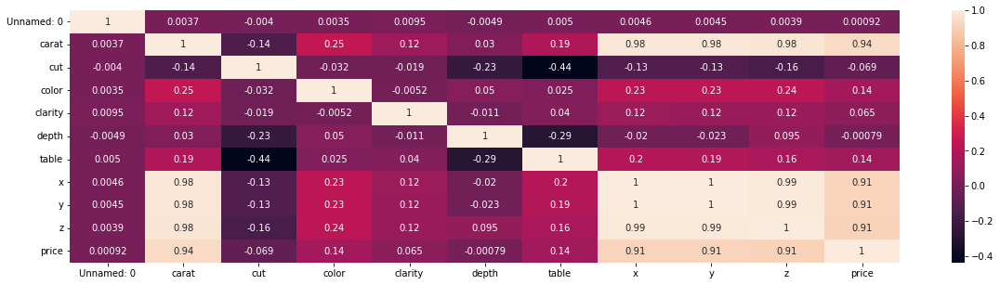

In [129]:
sns.heatmap(data.corr(),annot = True)

our target output variable is price so now let's check the correlation of price that how it correlates the other variables 

In [130]:
correlations = data.corr()
correlations["price"].sort_values(ascending=False)

price         1.000000
carat         0.936741
y             0.914191
x             0.912759
z             0.905737
color         0.144033
table         0.137971
clarity       0.064958
Unnamed: 0    0.000917
depth        -0.000789
cut          -0.068770
Name: price, dtype: float64

the above shows that the price is highly effected with the carat, x, y, z

# Train_Test_Split

In [173]:
X = data.iloc[:, [1,2,3,4,5,6,7,8,9]]
y = data['price']

In [174]:
X.head()

,carat,cut,color,clarity,depth,table,x,y,z
0,0.30,5,1,1,62.1,58.0,4.27,4.29,2.66
1,0.33,4,2,2,60.8,58.0,4.42,4.46,2.70
2,0.90,3,1,3,62.2,60.0,6.04,6.12,3.78
3,0.42,5,3,4,61.6,56.0,4.82,4.80,2.96
4,0.31,5,3,5,60.4,59.0,4.35,4.43,2.65


In [175]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( 
          X, y, test_size = 0.3, random_state = 100)

# Model_Selection

In [176]:
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR 
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score

In [177]:
df_models = pd.DataFrame(data=None, columns=['Algorithm', 'r2_train', 'r2_test'])

def make_model(X_tr, X_te, y_tr, y_te, model, model_name: str): 
    model.fit(X_tr, y_tr)
    y_pred_train = model.predict(X_tr)
    y_pred_test = model.predict(X_te)
    r2_train = r2_score(y_tr, y_pred_train)
    r2_test = r2_score(y_te, y_pred_test)
    df_models.loc[len(df_models.index)] = [model_name, r2_train, r2_test]
make_model(X_train, X_test, y_train, y_test, LinearRegression(), 'LinearRegression')
make_model(X_train, X_test, y_train, y_test, Ridge(), 'Ridge')
make_model(X_train, X_test, y_train, y_test, Lasso(), 'Lasso')
make_model(X_train, X_test, y_train, y_test, ElasticNet(), 'ElasticNet')
make_model(X_train, X_test, y_train, y_test, KNeighborsRegressor(),'KNeighborsRegressor')
make_model(X_train, X_test, y_train, y_test, SVR(),'SVR')
make_model(X_train, X_test, y_train, y_test, DecisionTreeRegressor(),'DecisionTreeRegressor')
make_model(X_train, X_test, y_train, y_test, GradientBoostingRegressor(), 'GradientBoosting')
make_model(X_train, X_test, y_train, y_test, RandomForestRegressor(), 'RandomForest')
make_model(X_train, X_test, y_train, y_test, XGBRegressor(), 'XGBoost')

In [178]:
fig = go.Figure(data=[
    go.Bar(name='r2_train', x=df_models.Algorithm, y=df_models.r2_train),
    go.Bar(name='r2_test', x=df_models.Algorithm, y=df_models.r2_test)
])
fig.update_layout(template='plotly_dark', title='R2 for train and test', title_x=0.5)

rom the above graph it seems that different models and their r2 for training and testing of the data

now from the above graph there we see that Linear Regression, Ridge, Lasso,have approximately 90% score

Elasti Regressor which have a score of app 83%

KNN ,decisiontree and gradient boosting having a score of app 90%


randomforest and xboost regressor are showing the app 99%trainig and testing means this models which will best fit for the data

whereas  support vector regressor it shows the worst fit of the model



# Linear_Regression

In [201]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [202]:
y_pred=lr.predict(X_test)

In [203]:
y_pred

array([1836.03320742, 5822.01722252, 3374.52461538, ..., 9583.18917271,
        -56.18491676, 6445.25125848])

In [204]:
lr.score(X_train, y_train)

0.8968581256838092

In [205]:
lr.score(X_test, y_test)

0.900770366753029

In [220]:
test_pred_df = pd.DataFrame({'Actual Value':y_test,'predicted value':y_pred,'Residuals':y_test-y_pred})
test_pred_df.head(10)

,Actual Value,predicted value,Residuals
26605,702.0,1836.033207,-1134.033207
9397,6090.0,5822.017223,267.982777
14885,2281.0,3374.524615,-1093.524615
10242,980.0,1270.185198,-290.185198
3898,789.0,766.076208,22.923792
21948,924.0,750.388152,173.611848
13040,1631.0,2677.665132,-1046.665132
25739,614.0,1228.274772,-614.274772
13271,900.0,887.668398,12.331602
11963,505.0,-163.306833,668.306833


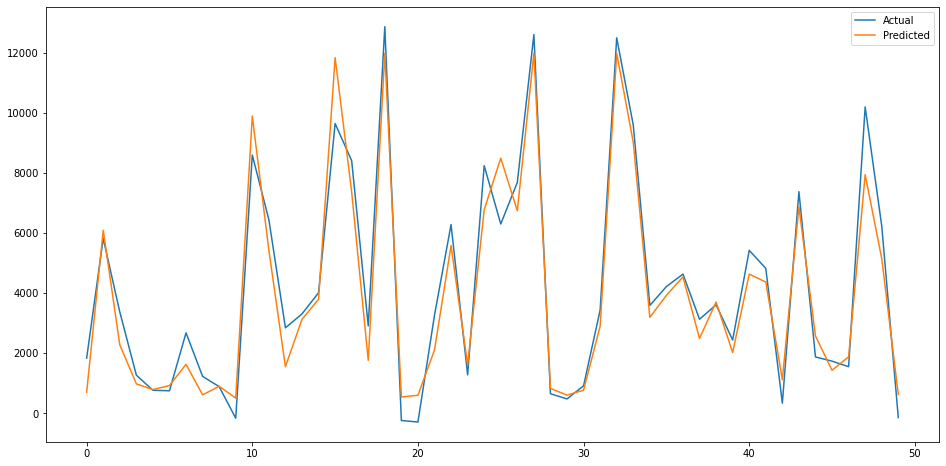

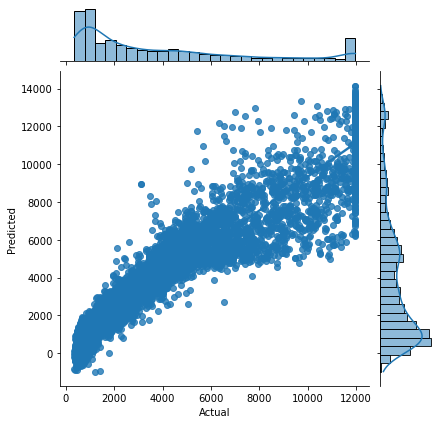

In [207]:
test = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
fig= plt.figure(figsize=(16,8))
test = test.reset_index()
test = test.drop(['index'],axis=1)
plt.plot(test[:50])
plt.legend(['Actual','Predicted'])
sns.jointplot(x='Actual',y='Predicted',data=test,kind='reg',);

In [225]:
fig = ax.scatter(test_pred_df, x="Actual Value", y="predicted value", trendline="ols", color_discrete_sequence=['steelbl'],
                template='plotly_dark', title='<b> scatter plot of Actual,Predicted & Residuals in linear regression ', color='Residuals', color_continuous_scale=ax.colors.sequential.Blues)
fig.update_layout(title_x=0.5)
fig.show()

now lets chech the some random values to be placed in the predicted models

In [226]:
####r2_value for linear regression model
r2_score(y_test,y_pred)

0.900770366753029

# Random_Forest_Regressor

In [215]:
rfg=RandomForestRegressor()

In [216]:
rfg.fit(X_train, y_train)

RandomForestRegressor()

In [218]:
rfg_pred = rfg.predict(X_test)
rfg_pred

array([  768.05 ,  4699.63 ,  2236.51 , ...,  9008.915,   536.98 ,
       10237.105])

In [222]:
test_pred_df1 = pd.DataFrame({'Actual Value':y_test,'predicted value':rfg_pred,'Residuals':y_test-rfg_pred})
test_pred_df1.head(10)

,Actual Value,predicted value,Residuals
26605,702.0,768.05,-66.05
9397,6090.0,4699.63,1390.37
14885,2281.0,2236.51,44.49
10242,980.0,1039.97,-59.97
3898,789.0,964.95,-175.95
21948,924.0,925.64,-1.64
13040,1631.0,1509.81,121.19
25739,614.0,618.48,-4.48
13271,900.0,750.11,149.89
11963,505.0,517.05,-12.05


In [224]:
fig = ax.scatter(test_pred_df1, x="Actual Value", y="predicted value", trendline="ols", color_discrete_sequence=['steelbl'],
                template='plotly_dark', title='<b> scatter plot of Actual,Predicted & Residuals in random forest ', color='Residuals', color_continuous_scale=ax.colors.sequential.Blues)
fig.update_layout(title_x=0.5)
fig.show()

In [227]:
####r2_value for Randomforest regression model
r2_score(y_test,rfg_pred)

0.986371620220517

# XGBoost_Regressor

In [230]:
xgb = XGBRegressor()
xgb.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [231]:
xgb_pred = xgb.predict(X_test)
xgb_pred

array([  706.6872 ,  4996.417  ,  2231.6677 , ...,  9646.704  ,
         576.62164, 10496.7    ], dtype=float32)

In [232]:
test_pred_df2 = pd.DataFrame({'Actual Value':y_test,'predicted value':xgb_pred,'Residuals':y_test-xgb_pred})
test_pred_df2.head(10)

,Actual Value,predicted value,Residuals
26605,702.0,706.687195,-4.687195
9397,6090.0,4996.416992,1093.583008
14885,2281.0,2231.667725,49.332275
10242,980.0,961.865662,18.134338
3898,789.0,879.732544,-90.732544
21948,924.0,943.227417,-19.227417
13040,1631.0,1541.367676,89.632324
25739,614.0,629.854431,-15.854431
13271,900.0,768.707031,131.292969
11963,505.0,523.918213,-18.918213


In [233]:
fig = ax.scatter(test_pred_df2, x="Actual Value", y="predicted value", trendline="ols", color_discrete_sequence=['steelbl'],
                template='plotly_dark', title='<b> scatter plot of Actual,Predicted & Residuals in XGBoost ', color='Residuals', color_continuous_scale=ax.colors.sequential.Blues)
fig.update_layout(title_x=0.5)
fig.show()

In [235]:
####r2_value for XGBoost regressor model
r2_score(y_test,xgb_pred)

0.986779042909172

In [236]:
  
df = {"Model": ["Linear Regression", "RandomForest Regression", "XGBoost Regressor"],
       "r2_value": [90.077036,98.637162,98.67790]}
  
df1 = pd.DataFrame(df)
df1

,Model,r2_value
0,Linear Regression,90.077036
1,RandomForest Regression,98.637162
2,XGBoost Regressor,98.677900


# Graphic_visualisation of different models and their scores

In [245]:
import plotly.graph_objects as go

fig = go.Figure(go.Bar(
            y=['Linear Regression', 'RandomForest Regression', 'XGBoost Regressor'],
            x=[90.077036,98.637162,98.67790],
            orientation='h'))

fig.show()

from above XGBoost is the best it model with high r2_value